In [3]:
from google.colab import files
files.upload()

Saving Test_dataset.xlsx to Test_dataset.xlsx
Saving Train_dataset.xlsx to Train_dataset.xlsx


{'Test_dataset.xlsx': b'PK\x03\x04\x14\x00\x06\x00\x08\x00\x00\x00!\x00b\xee\x9dh^\x01\x00\x00\x90\x04\x00\x00\x13\x00\x08\x02[Content_Types].xml \xa2\x04\x02(\xa0\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\

In [1]:
!ls

Prob_20_03.csv	sample_data	   Train_dataset.xlsx
Prob_27_03.csv	Test_dataset.xlsx


In [0]:
#Importing required libraries and functions

#Libraries to load the dataset
import pandas as pd
import numpy as np

#Libraries/Functions for Data Pre-processing
#import category_encoders as ce
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder,OneHotEncoder
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import r2_score
#Functions for building ML models
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.preprocessing import PolynomialFeatures
from sklearn.neighbors import KNeighborsRegressor as knn
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
#Functions for time series analysis
from statsmodels.tsa.arima_model import ARIMA

#Functions for Data-visualisatoin
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [0]:
train=pd.read_excel('Train_dataset.xlsx')
test=pd.read_excel('Test_dataset.xlsx')

In [4]:
train.shape

(10714, 28)

In [5]:
test.shape

(14498, 27)

In [6]:
  train.head()

,people_ID,Region,Gender,Designation,Name,Married,Children,Occupation,Mode_transport,cases/1M,Deaths/1M,comorbidity,Age,Coma score,Pulmonary score,cardiological pressure,Diuresis,Platelets,HBB,d-dimer,Heart rate,HDL cholesterol,Charlson Index,Blood Glucose,Insurance,salary,FT/month,Infect_Prob
0,1,Bhubaneshwar,Female,Mrs,mansi,YES,1.0,Farmer,Public,2,0,Hypertension,68,8,<400,Normal,441.0,154.0,93.0,233.0,82.0,58.0,27,7,3600000.0,1300000,2.0,49.135010
1,2,Bhubaneshwar,Female,Mrs,riya masi,YES,2.0,Farmer,Walk,2,0,Diabetes,64,15,<100,Stage-02,NaN,121.0,56.0,328.0,89.0,68.0,5,6,1600000.0,400000,1.0,51.147880
2,3,Bhubaneshwar,Female,Mrs,sunita,NO,1.0,Cleaner,Public,2,0,None,19,13,<300,Elevated,416.0,124.0,137.0,213.0,77.0,43.0,40,6,3400000.0,900000,1.0,73.224000
3,4,Bhubaneshwar,Female,Mrs,anjali @ babli,YES,1.0,Driver,Car,2,0,Coronary Heart Disease,33,9,<200,Stage-01,410.0,98.0,167.0,275.0,64.0,60.0,27,7,700000.0,2300000,1.0,48.779225
4,5,Bhubaneshwar,Female,Mrs,champa karketta,NO,2.0,Manufacturing,Car,2,0,Diabetes,23,7,<400,Normal,390.0,21.0,153.0,331.0,71.0,64.0,32,7,3200000.0,1100000,1.0,87.868800


In [7]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10714 entries, 0 to 10713
Data columns (total 28 columns):
people_ID                 10714 non-null int64
Region                    10714 non-null object
Gender                    10714 non-null object
Designation               10714 non-null object
Name                      10694 non-null object
Married                   10714 non-null object
Children                  10403 non-null float64
Occupation                9967 non-null object
Mode_transport            10711 non-null object
cases/1M                  10714 non-null int64
Deaths/1M                 10714 non-null int64
comorbidity               10488 non-null object
Age                       10714 non-null int64
Coma score                10714 non-null int64
Pulmonary score           10714 non-null object
cardiological pressure    10617 non-null object
Diuresis                  9998 non-null float64
Platelets                 9790 non-null float64
HBB                       10698 

In [0]:
#Defining columns to be filled
to_be_filled = ['Children','Occupation','Mode_transport','comorbidity','cardiological pressure','Diuresis','Platelets','HBB','d-dimer','Heart rate','HDL cholesterol','Insurance','FT/month']
ctg_vb=['Region','Gender','Married','Occupation','Mode_transport', 'comorbidity','Pulmonary score','cardiological pressure']

#Function to fill the NaN values
#NaN is replaced with most occuring value if the feature is categorical else filled with median value
def fill_values(df,col):
    if((col in ctg_vb) or (col=='Children')):
        df[col] = df[col].fillna(df[col].value_counts().index[0])
    else:
        df[col] = df[col].fillna(df[col].mean())
    return df

for col in to_be_filled:
    train = fill_values(train,col)
    test =  fill_values(test,col)

In [9]:
####Checking training dataset for presence of NaN values
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10714 entries, 0 to 10713
Data columns (total 28 columns):
people_ID                 10714 non-null int64
Region                    10714 non-null object
Gender                    10714 non-null object
Designation               10714 non-null object
Name                      10694 non-null object
Married                   10714 non-null object
Children                  10714 non-null float64
Occupation                10714 non-null object
Mode_transport            10714 non-null object
cases/1M                  10714 non-null int64
Deaths/1M                 10714 non-null int64
comorbidity               10714 non-null object
Age                       10714 non-null int64
Coma score                10714 non-null int64
Pulmonary score           10714 non-null object
cardiological pressure    10714 non-null object
Diuresis                  10714 non-null float64
Platelets                 10714 non-null float64
HBB                       107

In [10]:
#Dropping the columns which are not essential
to_drop_1 = ['people_ID','Designation', 'Name','Region','Infect_Prob']
new_df_train = train.copy().drop(to_drop_1 ,axis=1)
y = train['Infect_Prob']

to_drop_2 = ['people_ID','Designation','Name','Region']
test_id = test['people_ID']
new_df_test = test.copy().drop(to_drop_2, axis=1)

new_df_train.head()

,Gender,Married,Children,Occupation,Mode_transport,cases/1M,Deaths/1M,comorbidity,Age,Coma score,Pulmonary score,cardiological pressure,Diuresis,Platelets,HBB,d-dimer,Heart rate,HDL cholesterol,Charlson Index,Blood Glucose,Insurance,salary,FT/month
0,Female,YES,1.0,Farmer,Public,2,0,Hypertension,68,8,<400,Normal,441.000000,154.0,93.0,233.0,82.0,58.0,27,7,3600000.0,1300000,2.0
1,Female,YES,2.0,Farmer,Walk,2,0,Diabetes,64,15,<100,Stage-02,278.806261,121.0,56.0,328.0,89.0,68.0,5,6,1600000.0,400000,1.0
2,Female,NO,1.0,Cleaner,Public,2,0,None,19,13,<300,Elevated,416.000000,124.0,137.0,213.0,77.0,43.0,40,6,3400000.0,900000,1.0
3,Female,YES,1.0,Driver,Car,2,0,Coronary Heart Disease,33,9,<200,Stage-01,410.000000,98.0,167.0,275.0,64.0,60.0,27,7,700000.0,2300000,1.0
4,Female,NO,2.0,Manufacturing,Car,2,0,Diabetes,23,7,<400,Normal,390.000000,21.0,153.0,331.0,71.0,64.0,32,7,3200000.0,1100000,1.0


In [11]:
print("Training data shape: ",new_df_train.shape)
print("Test data Shape: ",new_df_test.shape)

Training data shape:  (10714, 23)
Test data Shape:  (14498, 23)


In [0]:
###Listing Out Categorical And Continuous variables for data preprocessing purposes
ctg_vb=['Gender','Married','Occupation','Mode_transport', 'comorbidity','Pulmonary score','cardiological pressure']
cts_vb=list(set(new_df_train.columns)-set(ctg_vb)-set(['Children']))

In [0]:
###Function for label encoding of Categorical variables
le = LabelEncoder()
def l_encoder(col,df_train,df_test): 
    le.fit(df_train[col])
    integer_encoded1=le.transform(df_train[col])
    int_2=le.transform(df_test[col])
    df_train[col] = integer_encoded1.reshape(-1, 1)
    df_test[col]=int_2.reshape(-1,1)
    return df_train,df_test


In [0]:
###Function to standardise continuous variables
scaler = StandardScaler()
def z_score_scaling(col,df_train,df_test):
    a=df_train[col].values.reshape(-1,1)
    b=df_test[col].values.reshape(-1,1)
    scaler.fit(a)
    df_train[col]=scaler.transform(a)
    df_test[col]=scaler.transform(b)
    return df_train,df_test

In [16]:
### Training data before data preprocessing
new_df_train.head()

,Gender,Married,Children,Occupation,Mode_transport,cases/1M,Deaths/1M,comorbidity,Age,Coma score,Pulmonary score,cardiological pressure,Diuresis,Platelets,HBB,d-dimer,Heart rate,HDL cholesterol,Charlson Index,Blood Glucose,Insurance,salary,FT/month
0,Female,YES,1.0,Farmer,Public,2,0,Hypertension,68,8,<400,Normal,441.000000,154.0,93.0,233.0,82.0,58.0,27,7,3600000.0,1300000,2.0
1,Female,YES,2.0,Farmer,Walk,2,0,Diabetes,64,15,<100,Stage-02,278.806261,121.0,56.0,328.0,89.0,68.0,5,6,1600000.0,400000,1.0
2,Female,NO,1.0,Cleaner,Public,2,0,None,19,13,<300,Elevated,416.000000,124.0,137.0,213.0,77.0,43.0,40,6,3400000.0,900000,1.0
3,Female,YES,1.0,Driver,Car,2,0,Coronary Heart Disease,33,9,<200,Stage-01,410.000000,98.0,167.0,275.0,64.0,60.0,27,7,700000.0,2300000,1.0
4,Female,NO,2.0,Manufacturing,Car,2,0,Diabetes,23,7,<400,Normal,390.000000,21.0,153.0,331.0,71.0,64.0,32,7,3200000.0,1100000,1.0


In [0]:
for col in cts_vb:
    new_df_train,new_df_test=z_score_scaling(col,new_df_train,new_df_test)
for col in ctg_vb:
    new_df_train,new_df_test=l_encoder(col,new_df_train,new_df_test)    

In [19]:
##Training data after preprocessing of dataset
new_df_train.head()

,Gender,Married,Children,Occupation,Mode_transport,cases/1M,Deaths/1M,comorbidity,Age,Coma score,Pulmonary score,cardiological pressure,Diuresis,Platelets,HBB,d-dimer,Heart rate,HDL cholesterol,Charlson Index,Blood Glucose,Insurance,salary,FT/month
0,0,1,1.0,4,1,-0.472554,-0.612505,2,1.691367,-0.272711,3,1,1.713615,1.654951,-0.420259,-1.023161,0.508209,0.515253,0.589446,1.418137,0.728501,-0.007758,1.264429
1,0,1,2.0,4,2,-0.472554,-0.612505,1,1.430316,1.611645,0,3,0.000000,0.830028,-1.091338,1.275137,1.005575,1.475246,-1.270564,0.703701,-0.797026,-1.489078,-0.005849
2,0,0,1.0,1,1,-0.472554,-0.612505,3,-1.506507,1.073257,2,0,1.449484,0.905021,0.377782,-1.507013,0.152947,-0.924736,1.688543,0.703701,0.575948,-0.666122,-0.005849
3,0,1,1.0,3,0,-0.472554,-0.612505,0,-0.592828,-0.003518,1,2,1.386092,0.255081,0.921901,-0.007071,-0.770732,0.707252,0.589446,1.418137,-1.483513,1.638153,-0.005849
4,0,0,2.0,6,0,-0.472554,-0.612505,1,-1.245456,-0.541905,3,1,1.174788,-1.669740,0.667979,1.347715,-0.273366,1.091249,1.012176,1.418137,0.423395,-0.336940,-0.005849


In [20]:
###Test Data after preprocessing
new_df_test.head()

,Gender,Married,Children,Occupation,Mode_transport,cases/1M,Deaths/1M,comorbidity,Age,Coma score,Pulmonary score,cardiological pressure,Diuresis,Platelets,HBB,d-dimer,Heart rate,HDL cholesterol,Charlson Index,Blood Glucose,Insurance,salary,FT/month
0,0,1,2,3,1,0.262431,0.558094,1,0.647163,-1.618680,1,2,1.153657,1.629954,1.447883,-0.853813,0.721366,0.035257,-0.256013,-1.439609,0.957330,-0.007758,-0.005849
1,1,1,2,5,2,0.262431,0.558094,1,0.712426,0.534870,1,2,1.375527,0.180088,0.395920,-0.829620,0.437157,0.803251,-1.524202,-0.010736,-0.644473,-0.007758,-0.005849
2,0,1,2,8,0,0.262431,0.558094,1,-0.462303,-0.003518,0,3,1.703049,-1.194785,0.903764,-0.950583,0.934523,-0.540739,0.335808,-1.439609,1.796370,1.144380,1.264429
3,0,1,2,8,0,0.262431,0.558094,3,-0.723354,0.804064,2,0,-0.769215,-0.244873,-0.601632,-1.555398,0.863470,-0.060742,-0.594197,0.703701,0.347119,-1.159896,1.264429
4,0,1,2,0,0,0.262431,0.558094,1,0.581901,-0.811099,1,2,-0.526215,0.530056,1.647393,0.888055,1.360836,1.475246,1.603997,-0.010736,-0.263092,0.321424,-0.005849


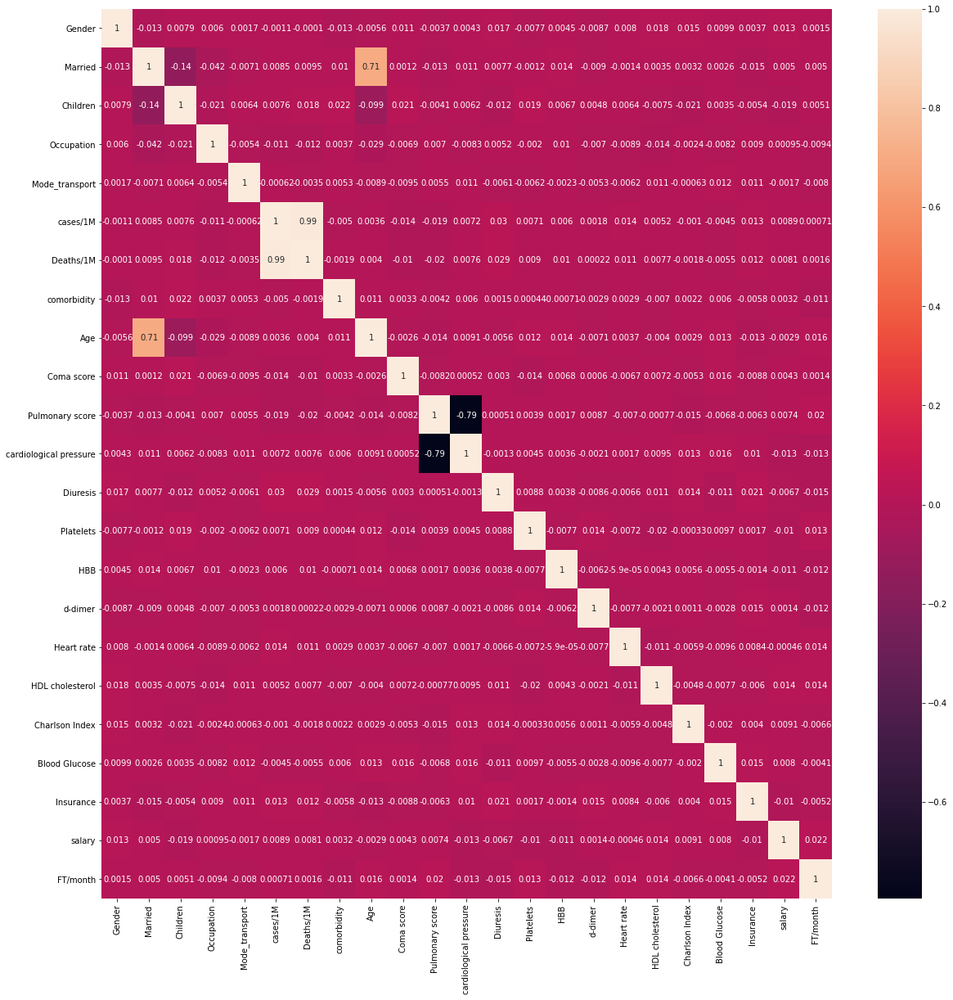

In [21]:
###Visualising relations between features of preprocessed data matrix 
plt.figure(figsize=[20,20])
sns.heatmap(new_df_train.corr(),annot=True)

In [23]:
###Splitting training data for model building
X_train,X_test,y_train,y_test= train_test_split(new_df_train,y,test_size=0.15,random_state=2)
print("training data shape: " ,X_train.shape)
print('testing  data shape: ' ,X_test.shape)


training data shape:  (9106, 23)
testing  data shape:  (1608, 23)


Fitting various models to find optimum model

In [26]:
#Using Ridge Linear Regression
model_lr_r = Ridge()
model_lr_r.fit(X_train,y_train)
y_pred = model_lr_r.predict(X_test)
print('MSE: ',mse(y_test,y_pred))
print('MAE: ',mae(y_test,y_pred))

MSE:  79.89903540734026
MAE:  4.422661227908705


In [35]:
#Using Lasso Linear Regression
model_lr_l = Lasso()
model_lr_l.fit(X_train,y_train)
y_pred = model_lr_l.predict(X_test)
print('MSE: ',mse(y_test,y_pred))
print('MAE: ',mae(y_test,y_pred))

MSE:  85.55063723374934
MAE:  5.3445153386859605


In [40]:
#Using Random Forest Regressor
model_rf = RandomForestRegressor(n_estimators=500,max_depth=8)
model_rf.fit(X_train,y_train)
y_pred = model_rf.predict(X_test)
print('MSE: ',mse(y_test,y_pred))
print('MAE: ',mae(y_test,y_pred))

MSE:  75.34135731034013
MAE:  3.551966996969374


In [45]:
#Using Gradient Boosting Regresspr
model_gb = GradientBoostingRegressor()
model_gb.fit(X_train,y_train)
y_pred = model_gb.predict(X_test)
print('MSE: ',mse(y_test,y_pred))
print('MAE: ',mae(y_test,y_pred))

MSE:  74.53383112672282
MAE:  3.567207341875447


In [47]:
#Using XGB Regressor
model_x = XGBRegressor()
model_x.fit(X_train,y_train)
y_pred = model_x.predict(X_test)
print('MSE: ',mse(y_test,y_pred))
print('MAE: ',mae(y_test,y_pred))

[20:33:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
MSE:  75.2851040915948
MAE:  3.581039989180398


In [51]:
###Using SVM Regressor
model_svr = SVR(kernel='linear')
model_svr.fit(X_train,y_train)
y_pred = model_svr.predict(X_test)
print('MSE: ',mse(y_test,y_pred))
print('MAE: ',mae(y_test,y_pred))

MSE:  79.13679933395484
MAE:  4.128678523683784


In [65]:
#Using KNearestNeighbors Regression
model_knn = knn(n_neighbors=64,weights='uniform',leaf_size=120)
model_knn.fit(X_train,y_train)
y_pred = model_knn.predict(X_test)
print('MSE: ',mse(y_test,y_pred))
print('MAE: ',mae(y_test,y_pred))

MSE:  87.4881173581452
MAE:  4.903740523857762


In [69]:
###Using GridSearch Optimisation for sinding suitable parameters for a XGBoosting Regressor
model = XGBRegressor()
parameters = {
              'learning_rate': [0.1,0.01],
              
              'n_estimators': [100,150,250,500]}
clf = GridSearchCV(model, parameters, scoring='neg_mean_squared_error')
clf.fit(X_train,y_train)
print(clf.best_params_)
y_pred = clf.predict(X_test)
print('MSE: ',mse(y_test,y_pred))
print('MAE: ',mae(y_test,y_pred))

[20:51:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:51:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:51:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:51:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:51:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:51:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:51:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:51:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

In [87]:
###Using GridSearch Optimisation for sinding suitable parameters for a RandomForest Regressor
model2 = RandomForestRegressor()
parameters = {
              'max_depth': [8,16,12],
              
              'n_estimators': [100,150,250,500]}
clf2 = GridSearchCV(model2, parameters, scoring='neg_mean_squared_error')
clf2.fit(X_train,y_train)
print(clf2.best_params_)
y_pred = clf2.predict(X_test)
print('MSE: ',mse(y_test,y_pred))
print('MAE: ',mae(y_test,y_pred))

{'max_depth': 8, 'n_estimators': 500}
MSE:  75.38266280346716
MAE:  3.547773754322795


Part2: Time Series Forecasting of Diuresis followed by Infection_Prob calculation

In [71]:
#Loading Time-Series data of Diuresis rate
train = pd.ExcelFile('Train_dataset.xlsx')
diu_df = pd.read_excel(train, 'Diuresis_TS')
diu_df.head()

,people_ID,2020-03-20 00:00:00,2020-03-21 00:00:00,2020-03-22 00:00:00,2020-03-23 00:00:00,2020-03-24 00:00:00,2020-03-25 00:00:00,2020-03-26 00:00:00
0,1,441,544.2,669.64,821.368,1002.2416,1215.68992,1472.627904
1,2,151,197.2,253.24,321.688,399.9256,492.91072,606.892864
2,3,416,515.2,632.44,776.728,947.7736,1150.32832,1395.793984
3,4,410,506.0,621.40,761.880,928.1560,1126.78720,1368.344640
4,5,390,483.0,595.00,730.200,892.8400,1084.40800,1315.889600


In [72]:
##Checking for presence of NaN data
diu_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10714 entries, 0 to 10713
Data columns (total 8 columns):
people_ID              10714 non-null int64
2020-03-20 00:00:00    10714 non-null int64
2020-03-21 00:00:00    10714 non-null float64
2020-03-22 00:00:00    10714 non-null float64
2020-03-23 00:00:00    10714 non-null float64
2020-03-24 00:00:00    10714 non-null float64
2020-03-25 00:00:00    10714 non-null float64
2020-03-26 00:00:00    10714 non-null float64
dtypes: float64(6), int64(2)
memory usage: 669.8 KB


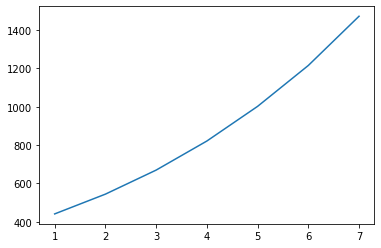

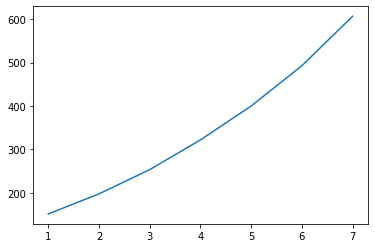

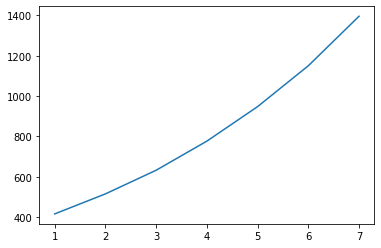

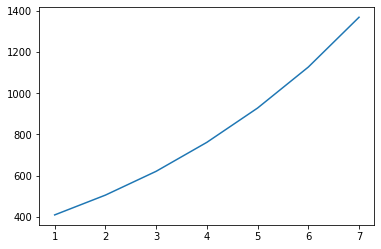

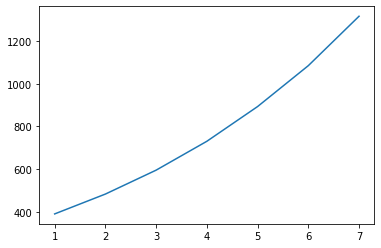

In [75]:
#Visualising Diuresis rate Vs Time(in Days) for pattern finding

for i in range(5):
  a = diu_df.iloc[i]
  a = a.to_numpy()
  a = np.delete(a,0,axis=0)
  x=[i for i in range(1,8)]
  x=np.asarray(x)
  plt.plot(x,a)
  plt.show()

In [0]:
##Forecasting Diuresis rate on 27 March  applying ARIMA forecasting model on training data
y_pred1=[]
for i in range(diu_df.shape[0]):
  tmp = diu_df.iloc[i]
  tmp = tmp.to_numpy()
  tmp = np.delete(tmp,0,axis=0)
  model = ARIMA(tmp, order=(0,2,0))
  model_fit = model.fit(disp=0)
  output = model_fit.forecast()
  y_pred1.append(output[0][0])
y_df = pd.DataFrame()
y_df['diu'] = y_pred1  

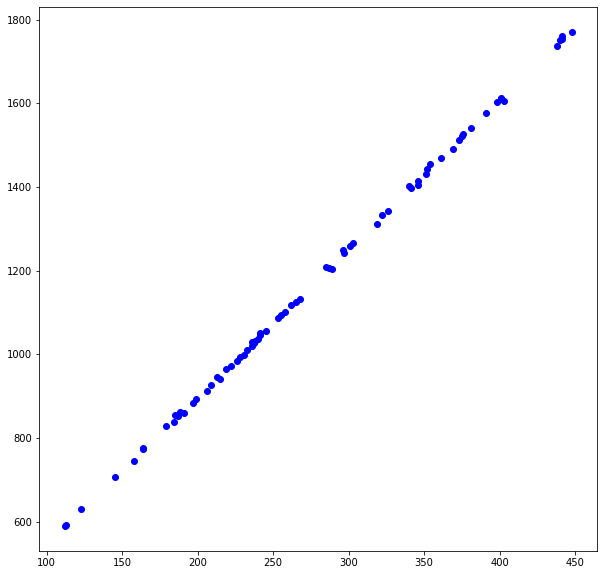

In [82]:
#Plotting Diuresis rate on March 20 Vs Diuresis rate on March 27
f = plt.figure(figsize=(10,10))
plt.plot(diu_df[diu_df.columns[1]][::150],y_df[::150],'ob')
plt.show()

In [0]:
scaler = StandardScaler()
tr_diu = pd.DataFrame(scaler.fit_transform(diu_df[diu_df.columns[1]].values.reshape(-1,1)))

In [0]:
#Using Linear Regression to find the Diuresis rate on March 27th for the people in test dataset
mod = LinearRegression()
mod.fit(tr_diu,y_df)
diu_pred = mod.predict(new_df_test['Diuresis'].values.reshape(-1,1))

test_df_2 = new_df_test.copy()
scaler.fit(diu_df[diu_df.columns[1]].values.reshape(-1,1))
test_df_2['Diuresis'] = pd.DataFrame(scaler.transform(diu_pred))

In [0]:
#Predicting the probility of infection using Gradient Boost Regressor on 20th March
y_pred_20 = model_rf.predict(new_df_test)
output_1 = pd.DataFrame({'people_ID':test_id,'Infect_Prob':y_pred_20})
output_1.to_csv('Inf_Prob_20_03.csv',index=False)

In [0]:
#Predicting the probility of infection using Gradient Boost Regressor on 27th March
y_pred_27 = model_rf.predict(new_df_test)
output_2 = pd.DataFrame({'people_ID':test_id,'Infect_Prob':y_pred_27})
output_2.to_csv('Inf_Prob_27_03.csv',index=False)